In [1]:
import os
import logging

logging.disable()
date = '2019-10-08'
data_location = '/user/simon/data/soar/flat_analisis_2019B/'
full_path_data_location = os.path.join(data_location, date)
# "2019-08-06"
# "2019-08-10"
# "2019-08-23"
# "2019-09-04"
# "2019-09-06"
# "2019-09-22"
# "2019-09-23"
# "2019-10-05"
# "2019-10-08"
# "2019-10-20"
# "2019-11-02"
# "2019-11-19"
# "2019-11-29"
# "2019-12-03"
# "2019-12-15"
# "2019-12-18"
# "2019-12-19"
# "2020-01-02"
# "2020-01-19"
# "2020-01-31"


In [2]:
import os
from ccdproc import ImageFileCollection, CCDData, subtract_bias
KEYWORDS = ['slit',
            'grating',
            'cam_targ',
            'grt_targ',
            'filter',
            'filter2',
            'gain',
            'roi',
            'wavmode',
            'exptime',
            'rdnoise',
            'ccdsum']

def get_flat_files_as_pandas_dataframe():
    ifc = ImageFileCollection(location=full_path_data_location, keywords=KEYWORDS, glob_include='*FLAT*')
    df = ifc.summary.to_pandas()
    groups = df.groupby(['slit',
                         'grating',
                         'cam_targ',
                         'grt_targ',
                         'filter',
                         'filter2',
                         'gain',
                         'roi',
                         'wavmode',
                         'exptime',
                         'rdnoise',
                         'ccdsum']).size().reset_index().rename(
        columns={0: 'count'})
    all_groups = []
    for i in groups.index:
        conf_group = df[((df['slit'] == groups.iloc[i]['slit']) &
                         (df['grating'] == groups.iloc[i]['grating']) &
                         (df['cam_targ'] == groups.iloc[i]['cam_targ']) &
                         (df['grt_targ'] == groups.iloc[i]['grt_targ']) &
                         (df['filter'] == groups.iloc[i]['filter']) &
                         (df['filter2'] == groups.iloc[i]['filter2']) &
                         (df['gain'] == groups.iloc[i]['gain']) &
                         (df['roi'] == groups.iloc[i]['roi']) &
                         (df['wavmode'] == groups.iloc[i]['wavmode']) &
                         (df['exptime'] == groups.iloc[i]['exptime']) &
                         (df['rdnoise'] == groups.iloc[i]['rdnoise']) &
                         (df['ccdsum'] == groups.iloc[i]['ccdsum']))]
        if len(conf_group) > 2:
            all_groups.append(conf_group.sort_values(by='file'))
        else:
            print("Group's length: {}".format(len(conf_group)))
            for __File in conf_group.file.values.tolist():
                print("Discarding File: {}".format(__File))
    return all_groups

In [3]:
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

def visualize_as_grid(group, date):
    group_name = "Date: {} Wavemode: {} Exptime: {}s".format(date, group.wavmode.unique()[0], group.exptime.unique()[0])
    nrows = int(np.ceil(len(group)/2.))
    ncols = 2
#     fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (16, nrows * 3 ))
   
    fig = plt.figure(figsize = (16, nrows * 3 ))
    fig.suptitle(group_name, fontsize=16)
    gs = fig.add_gridspec(ncols=ncols, nrows=nrows)
    for i, fits_file in enumerate(group.file.tolist()):
        ccd = CCDData.read(os.path.join(full_path_data_location, fits_file), unit='adu')
        z1 = np.mean(ccd.data) - 0.5 * np.std(ccd.data)
        z2 = np.median(ccd.data) + np.std(ccd.data)
        if i%2 == 0:
            y=0
        else:
            y=1
        ax_x = fig.add_subplot(gs[int(np.floor(i/2.)), y])
        ax_x.imshow(ccd.data, clim=(z1, z2), cmap='viridis')
        ax_x.title.set_text(fits_file)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])

##  Analisys


In [4]:

groups = get_flat_files_as_pandas_dataframe()

### Visual Inspection

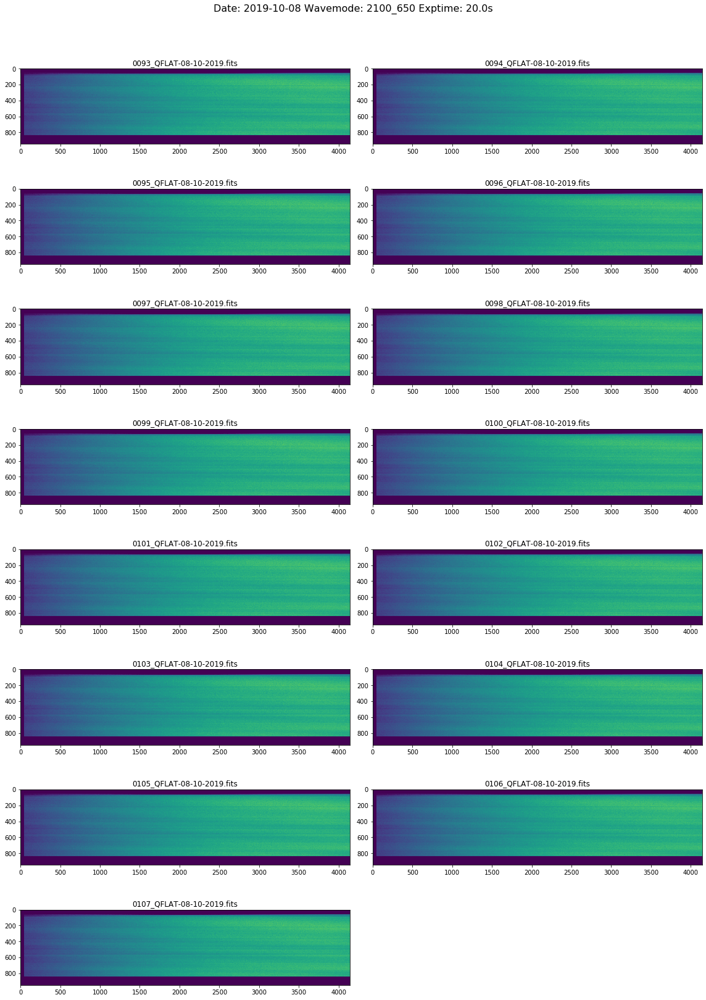

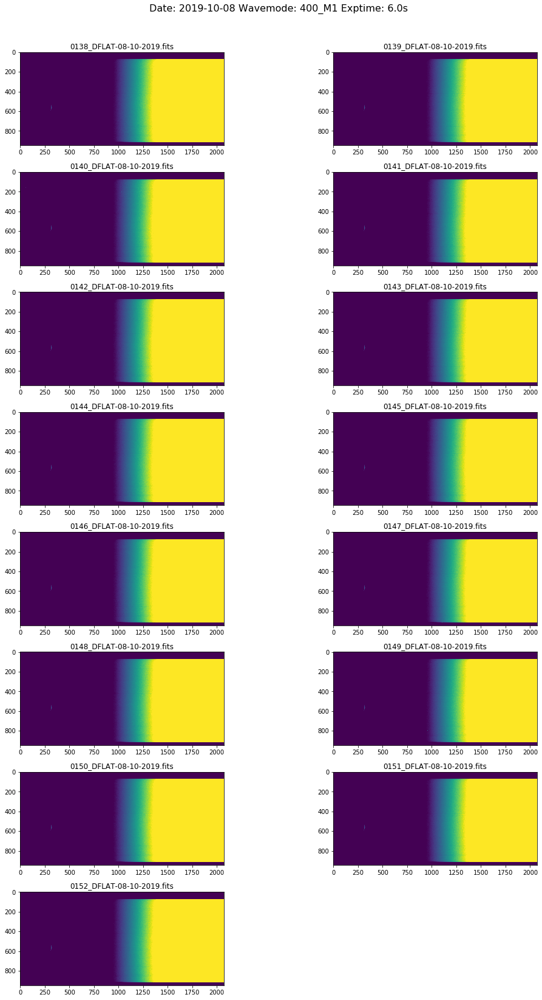

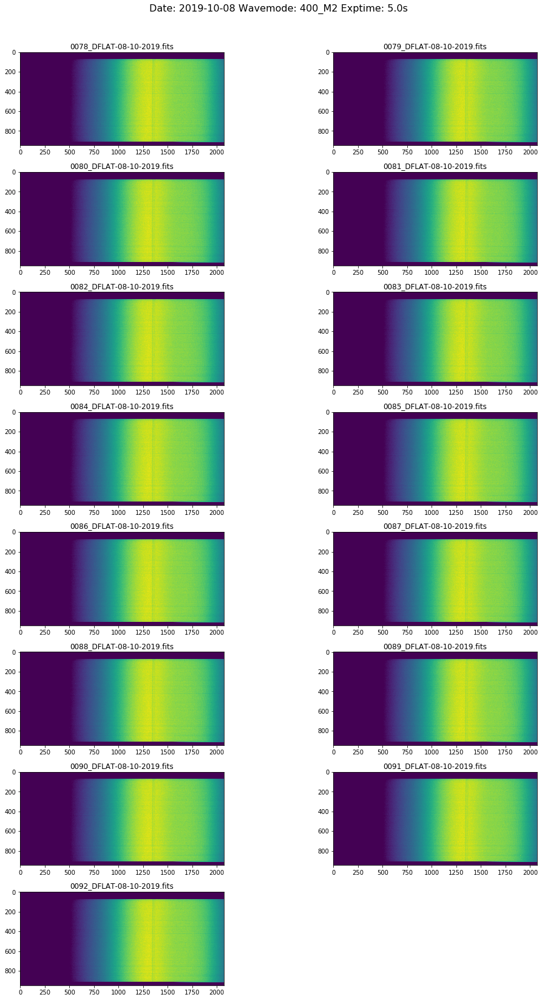

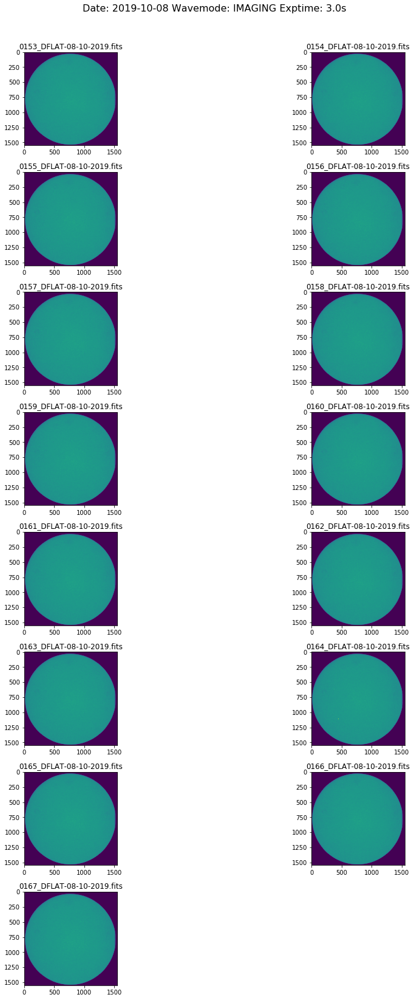

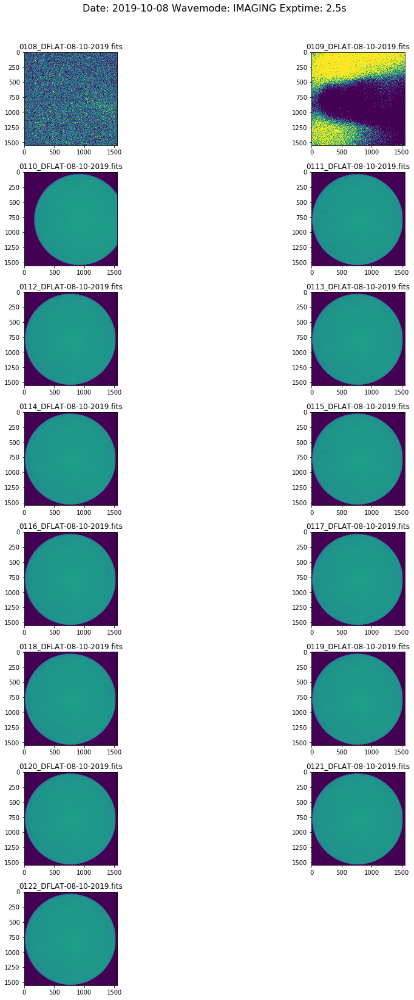

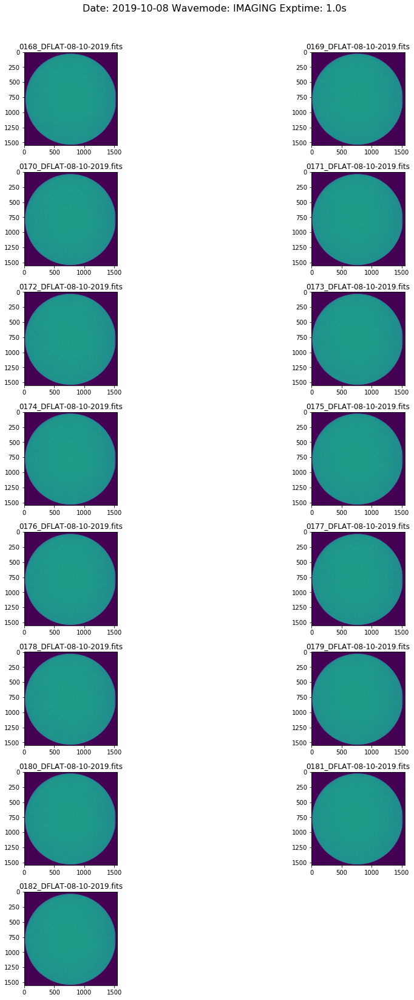

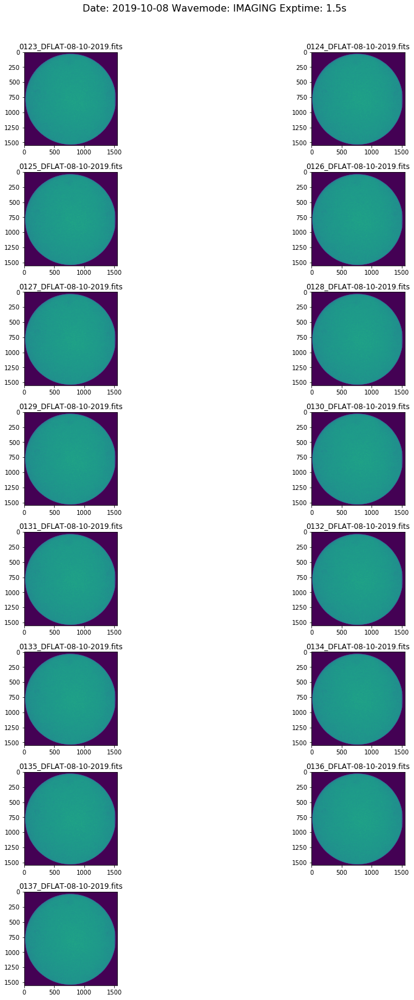

In [5]:
for group in groups:
    visualize_as_grid(group=group, date=date)

### Combine as MasterFlats

In [6]:
import re
def identify_technique(ccd):
    if 'Spectroscopic' in ccd.header['ROI'] or \
            ccd.header['OBSTYPE'] in ['ARC', 'SPECTRUM', 'COMP'] or \
            ccd.header['SLIT'] not in ['NO_MASK', '<NO MASK>'] or \
            ccd.header['GRATING'] not in ['NO_GRATING', '<NO GRATING>'] or \
            '_SP_' in ccd.header['OBJECT']:
        technique = 'Spectroscopy'
    elif 'Imaging' in ccd.header['ROI'] or \
            ccd.header['OBSTYPE'] in ['EXPOSE'] or\
            ccd.header['WAVMODE'] == 'IMAGING' or '_IM_' in ccd.header['OBJECT']:
        technique = 'Imaging'
    else:
        technique = 'Unknown'
    return technique


In [7]:
# !pip install goodman_pipeline==1.3.0rc3

In [8]:
import goodman_pipeline
import glob

print(goodman_pipeline.__version__)

from goodman_pipeline.core import create_master_flats, get_overscan_region, define_trim_section, get_slit_trim_section

1.3.0rc3


In [9]:
def combine_flats(group):
    new_data = []
    file_list = group.file.tolist()
    sample_file = os.path.join(data_location, date, file_list[0])
    sample_ccd = CCDData.read(sample_file, unit='adu')
    technique = identify_technique(ccd=sample_ccd)
    
    
    
    overscan_region = get_overscan_region(sample_image=sample_file, technique=technique)
    trim_section = define_trim_section(sample_image=sample_file, technique=technique)
    if technique == 'Spectroscopy':
        new_master_flat_name = "master_flat_{}_{}.fits".format(
            re.sub(' ', '_', sample_ccd.header['WAVMODE']),
            re.sub('[<> ]', '', sample_ccd.header['FILTER2']))
        print(new_master_flat_name)
        master_bias_name = "master_bias_{}_SP_{}x{}_R{:05.2f}_G{:05.2f}.fits".format(sample_ccd.header['INSTCONF'].upper(),
                                                                                     sample_ccd.header['CCDSUM'].split()[0],
                                                                                     sample_ccd.header['CCDSUM'].split()[1],
                                                                                     sample_ccd.header['RDNOISE'],
                                                                                     sample_ccd.header['GAIN'])
        master_bias_file = os.path.join(data_location, date, 'master_bias', master_bias_name)
        print(master_bias_file)
    else:
        new_master_flat_name = "master_flat_{}_{}.fits".format(
            re.sub(' ', '_', sample_ccd.header['WAVMODE']),
            re.sub('[<> ]', '', sample_ccd.header['FILTER']))
        print(new_master_flat_name)
        master_bias_name = "master_bias_{}_IM_{}x{}_R{:05.2f}_G{:05.2f}.fits".format(sample_ccd.header['INSTCONF'].upper(),
                                                                                     sample_ccd.header['CCDSUM'].split()[0],
                                                                                     sample_ccd.header['CCDSUM'].split()[1],
                                                                                     sample_ccd.header['RDNOISE'],
                                                                                     sample_ccd.header['GAIN'])
        master_bias_file = os.path.join(data_location, date, 'master_bias', master_bias_name)
        print(master_bias_file)
        
    if not os.path.isfile(master_bias_file):
        print("Master Bias {} does not exists".format(master_bias_file))
        master_bias_file = ''
        ignore_bias = True
        print("Ignoring bias!")
    else:
        print("Found master bias: {}".format(master_bias_file))
        ignore_bias = False
    
    master_flat, master_flat_name = create_master_flats(
        flat_files=file_list, 
        raw_data=os.path.join(data_location, date), 
        reduced_data=os.path.join(full_path_data_location, 'master_flats'), 
        technique=technique, 
        overscan_region=overscan_region, 
        trim_section=trim_section, 
        master_bias_name=master_bias_file, 
        new_master_flat_name=new_master_flat_name, 
        saturation_threshold=1, 
        ignore_bias=ignore_bias,)
    if technique == 'Spectroscopy':
        trim_section = get_slit_trim_section(master_flat=master_flat)
        
        master_flat = goodman_pipeline.core.image_trim(ccd=master_flat, trim_section=trim_section, trim_type='slit')
        master_flat.write(master_flat_name, overwrite=True)
        divider = 2.
    else:
        divider = 1.
    
    fig, ax = plt.subplots(figsize=(16, int(16/divider)))
    ax.title.set_text(os.path.basename(master_flat_name))
    z1 = np.mean(master_flat.data) - 0.5 * np.std(master_flat.data)
    z2 = np.median(master_flat.data) + np.std(master_flat.data)
    ax.imshow(master_flat.data, clim=(z1, z2), cmap='viridis')
    plt.show()
    print(master_flat_name)
    return technique, master_flat

master_flat_2100_650_GG455.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_SP_1x2_R03.89_G01.48.fits
Master Bias /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_SP_1x2_R03.89_G01.48.fits does not exists
Ignoring bias!


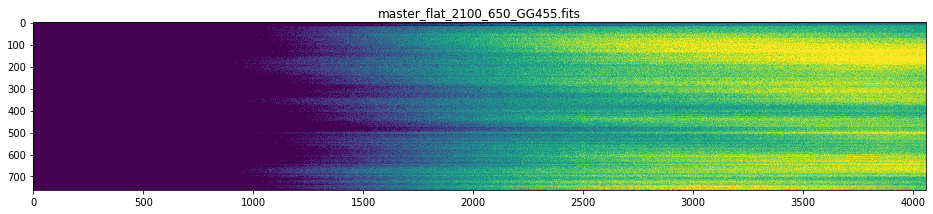

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_2100_650_GG455.fits
master_flat_400_M1_NO_FILTER.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_SP_2x2_R03.89_G01.48.fits
Found master bias: /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_SP_2x2_R03.89_G01.48.fits


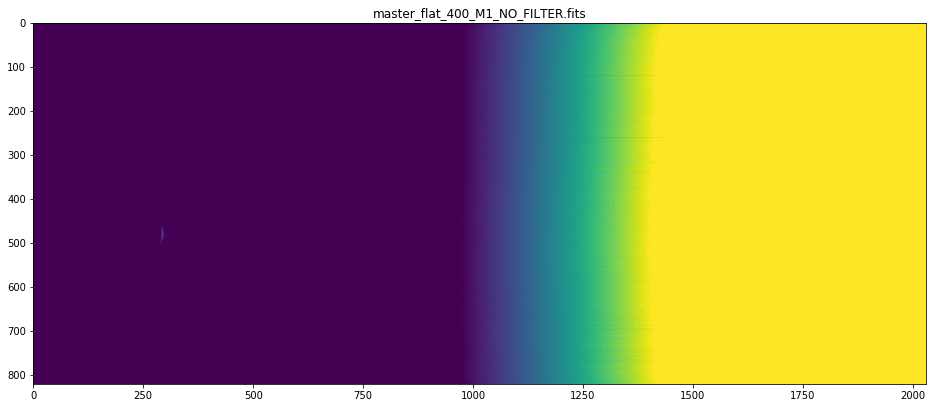

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_400_M1_NO_FILTER.fits
master_flat_400_M2_GG455.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_SP_2x2_R03.89_G01.48.fits
Found master bias: /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_SP_2x2_R03.89_G01.48.fits


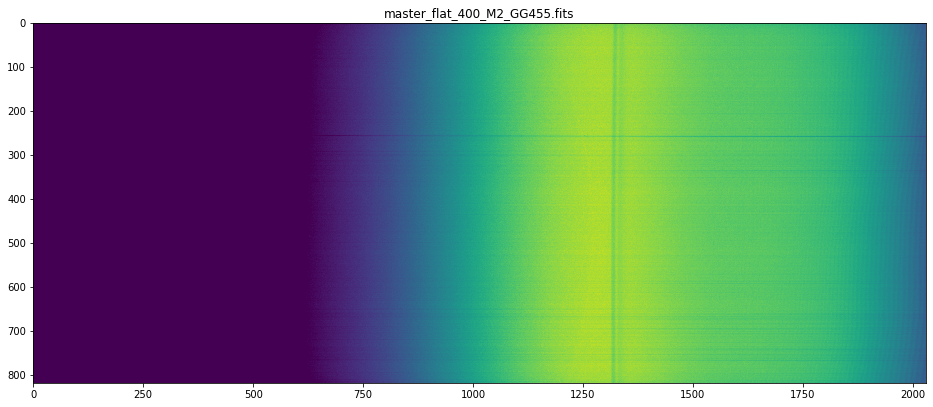

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_400_M2_GG455.fits
master_flat_IMAGING_VR.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits
Master Bias /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits does not exists
Ignoring bias!


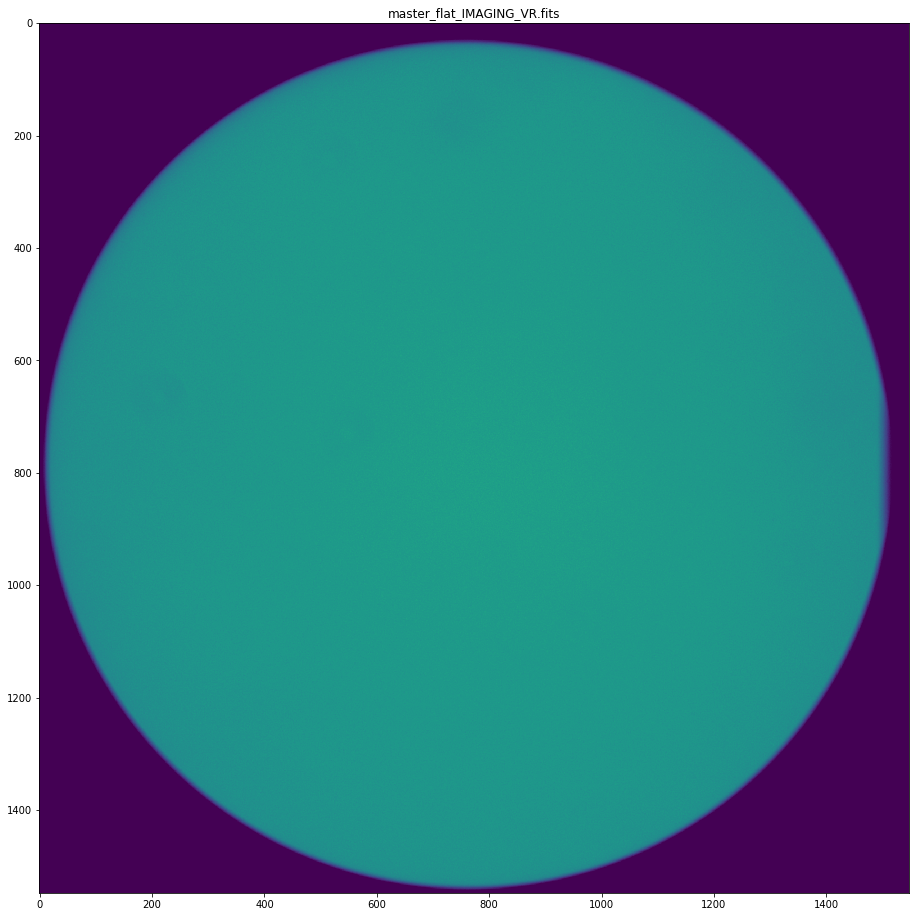

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_IMAGING_VR.fits
master_flat_IMAGING_g-SDSS.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits
Master Bias /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits does not exists
Ignoring bias!


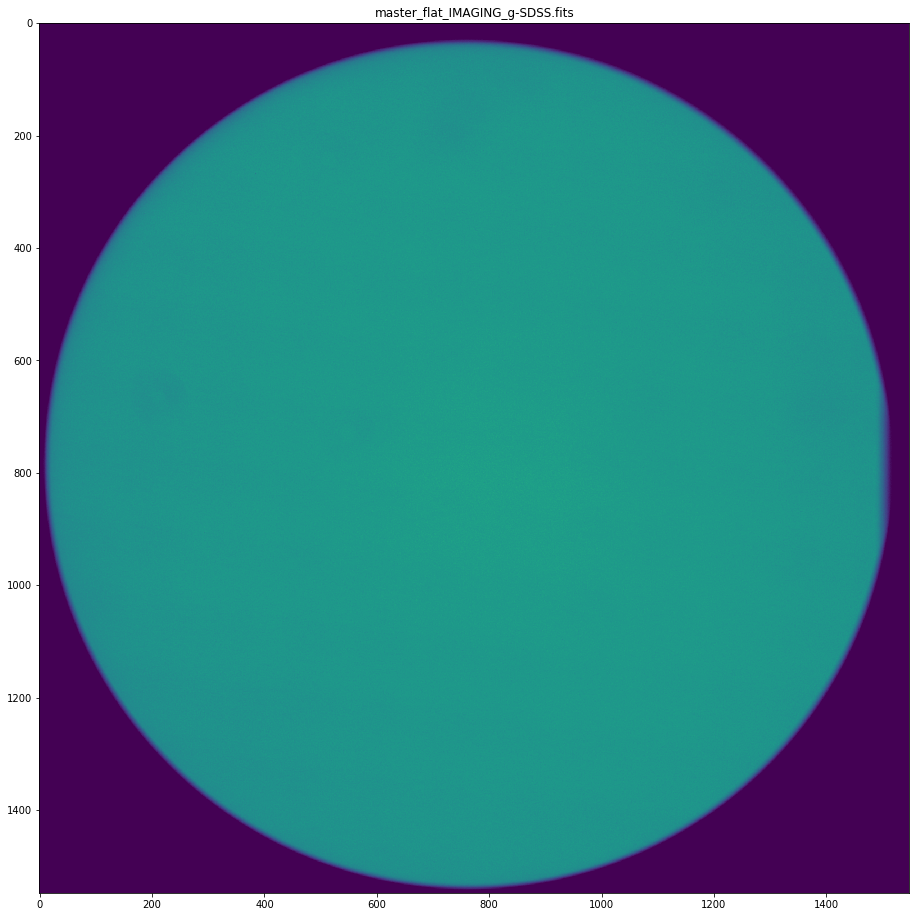

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_IMAGING_g-SDSS.fits
master_flat_IMAGING_i-SDSS.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits
Master Bias /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits does not exists
Ignoring bias!


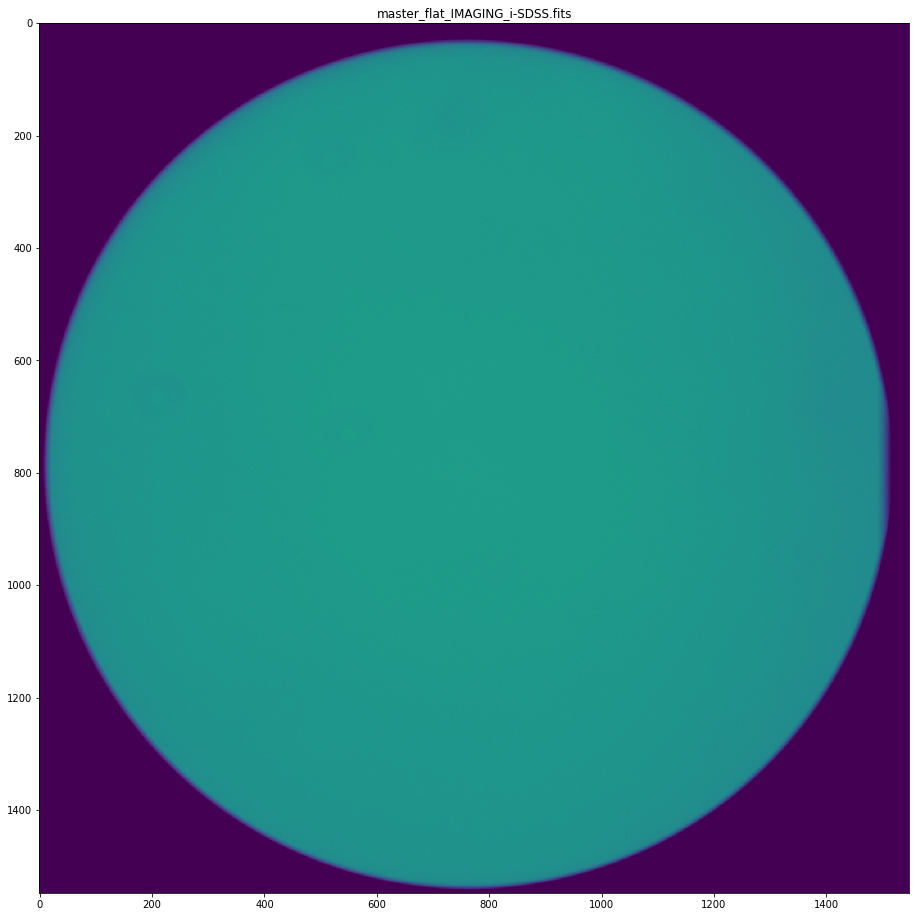

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_IMAGING_i-SDSS.fits
master_flat_IMAGING_r-SDSS.fits
/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits
Master Bias /user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_bias/master_bias_RED_IM_2x2_R03.89_G01.48.fits does not exists
Ignoring bias!


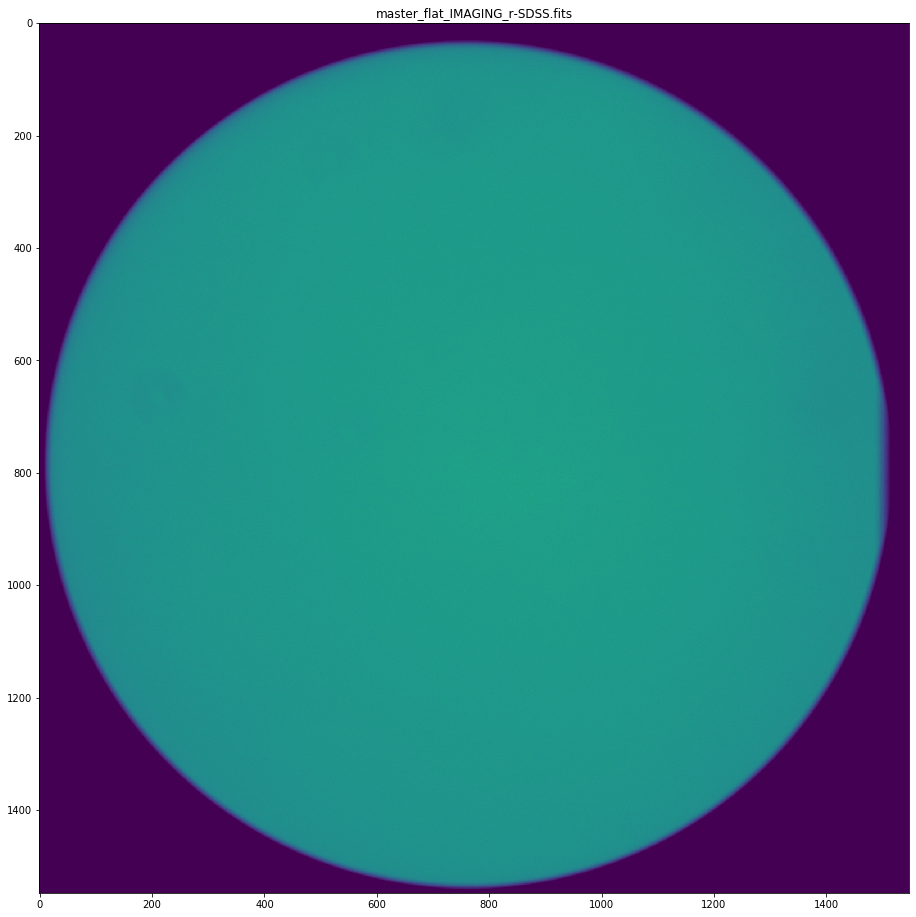

/user/simon/data/soar/flat_analisis_2019B/2019-10-08/master_flats/master_flat_IMAGING_r-SDSS.fits


In [10]:
all_data = []
for group in groups:
    technique, master_flat = combine_flats(group=group)
    all_data.append([group, technique, master_flat])

### Statistics


In [11]:
import logging

logger = logging.getLogger(__name__)
logger.propagate = False

In [12]:
%matplotlib inline

Spectroscopy Group Filter2: GG455 Grating: 2100_SYZY Slit: 0.45_LONG_SLIT Wavmode: 2100_650
Spectroscopy Group Filter2: NO_FILTER Grating: 400_SYZY Slit: 1.0_LONG_SLIT Wavmode: 400_M1
Spectroscopy Group Filter2: GG455 Grating: 400_SYZY Slit: 1.0_LONG_SLIT Wavmode: 400_M2
Imaging Group Filter: VR
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)
[724:823, 724:823]
(1548, 1548)
(100, 100)


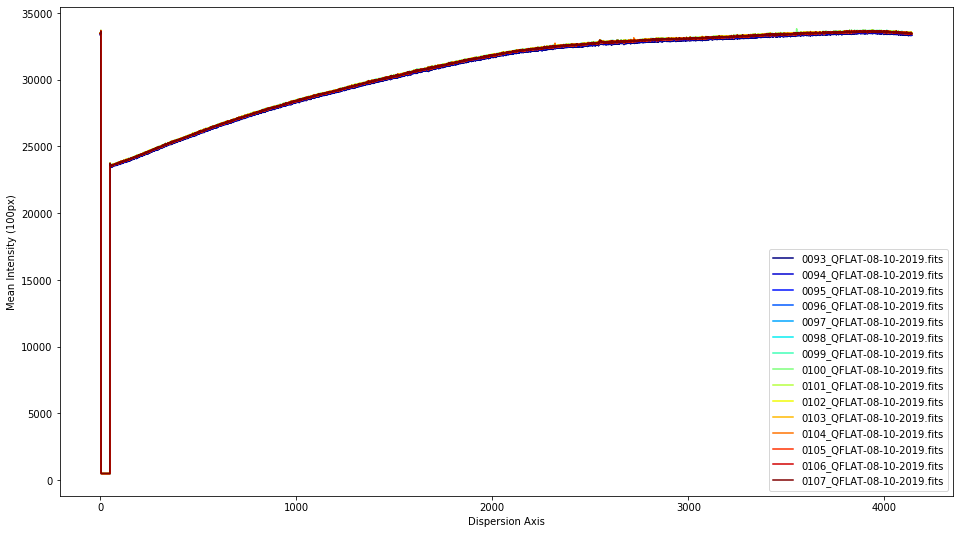

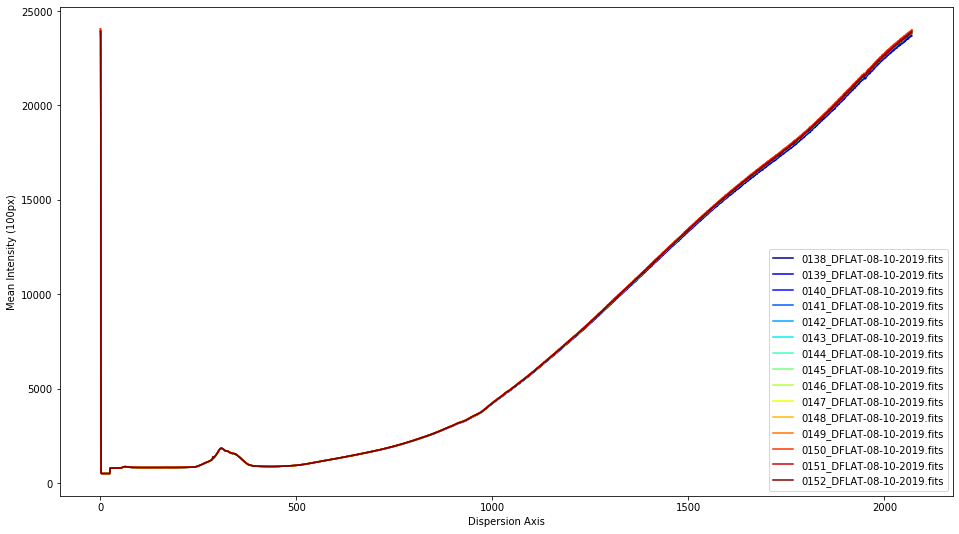

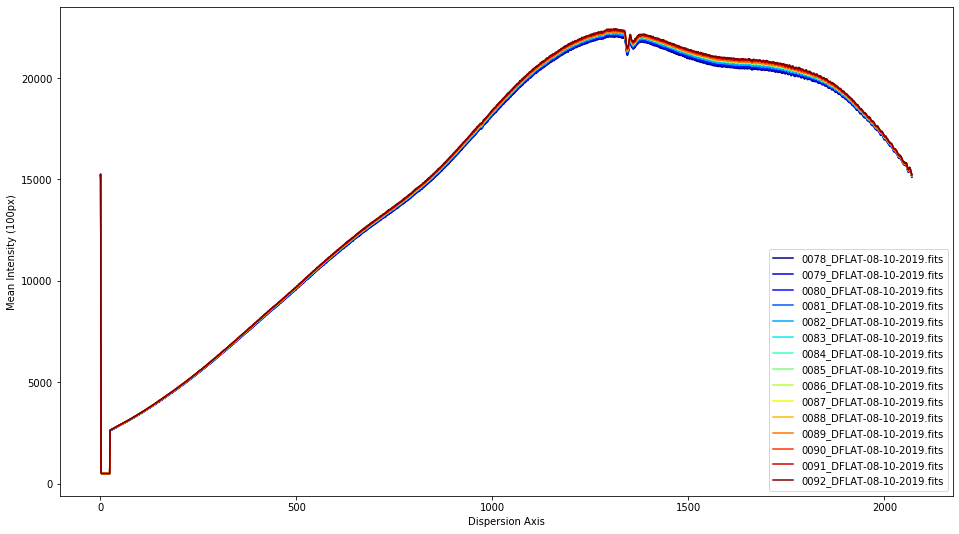

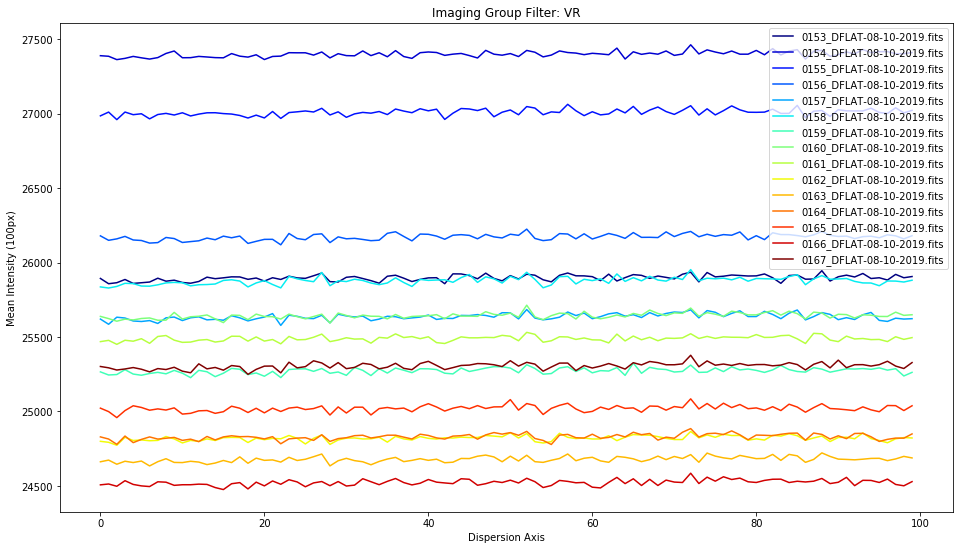

                          file   npix        mean      stddev    min    max
0   0153_DFLAT-08-10-2019.fits  10000  25897.0906  199.822692  21955  26610
1   0154_DFLAT-08-10-2019.fits  10000  27399.0429  211.068133  23242  28168
2   0155_DFLAT-08-10-2019.fits  10000  27008.7524  207.289444  22995  27763
3   0156_DFLAT-08-10-2019.fits  10000  26171.4540  201.873553  22174  26912
4   0157_DFLAT-08-10-2019.fits  10000  25635.9792  199.192235  21554  26431
5   0158_DFLAT-08-10-2019.fits  10000  25877.2940  201.407886  21921  26906
6   0159_DFLAT-08-10-2019.fits  10000  25273.0960  195.807967  21437  26011
7   0160_DFLAT-08-10-2019.fits  10000  25643.1163  198.641972  21823  26452
8   0161_DFLAT-08-10-2019.fits  10000  25489.1670  199.170298  21545  26227
9   0162_DFLAT-08-10-2019.fits  10000  24820.1508  193.984441  20976  25570
10  0163_DFLAT-08-10-2019.fits  10000  24678.3415  194.588933  20738  25452
11  0164_DFLAT-08-10-2019.fits  10000  24830.1182  195.591467  20769  25550
12  0165_DFL

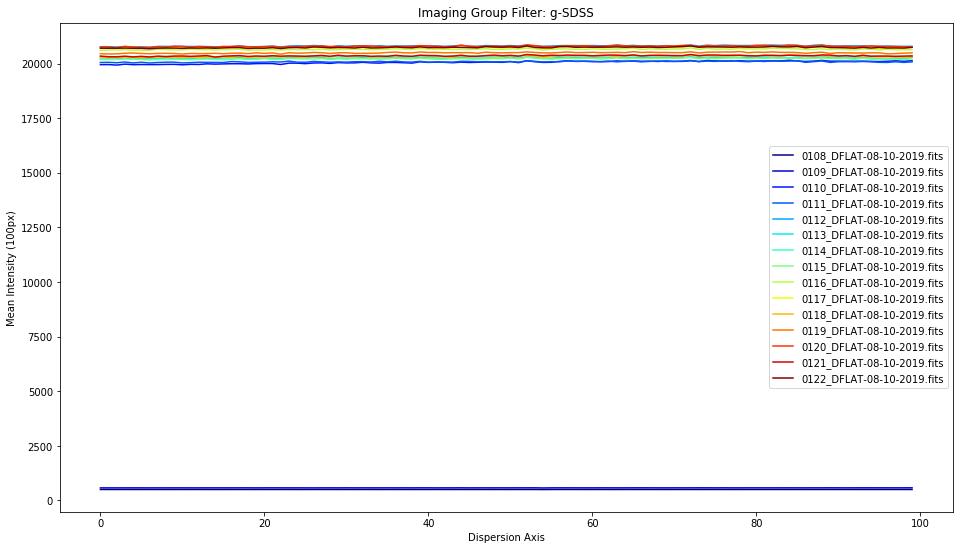

                          file   npix        mean      stddev    min    max
0   0108_DFLAT-08-10-2019.fits  10000    503.1133    2.954770    493    514
1   0109_DFLAT-08-10-2019.fits  10000    578.5345    7.878655    534    609
2   0110_DFLAT-08-10-2019.fits  10000  20059.5549  205.369732  16678  20800
3   0111_DFLAT-08-10-2019.fits  10000  20084.1002  187.894517  16835  20807
4   0112_DFLAT-08-10-2019.fits  10000  20805.8626  192.648113  17508  21465
5   0113_DFLAT-08-10-2019.fits  10000  20260.0125  189.482476  16766  21033
6   0114_DFLAT-08-10-2019.fits  10000  20335.4177  191.192176  17078  21046
7   0115_DFLAT-08-10-2019.fits  10000  20218.9471  188.341832  16759  20909
8   0116_DFLAT-08-10-2019.fits  10000  20653.5746  192.058178  17102  21511
9   0117_DFLAT-08-10-2019.fits  10000  20735.9707  195.297796  17431  21455
10  0118_DFLAT-08-10-2019.fits  10000  20332.0427  190.886600  17134  21037
11  0119_DFLAT-08-10-2019.fits  10000  20493.1706  192.072369  17040  21177
12  0120_DFL

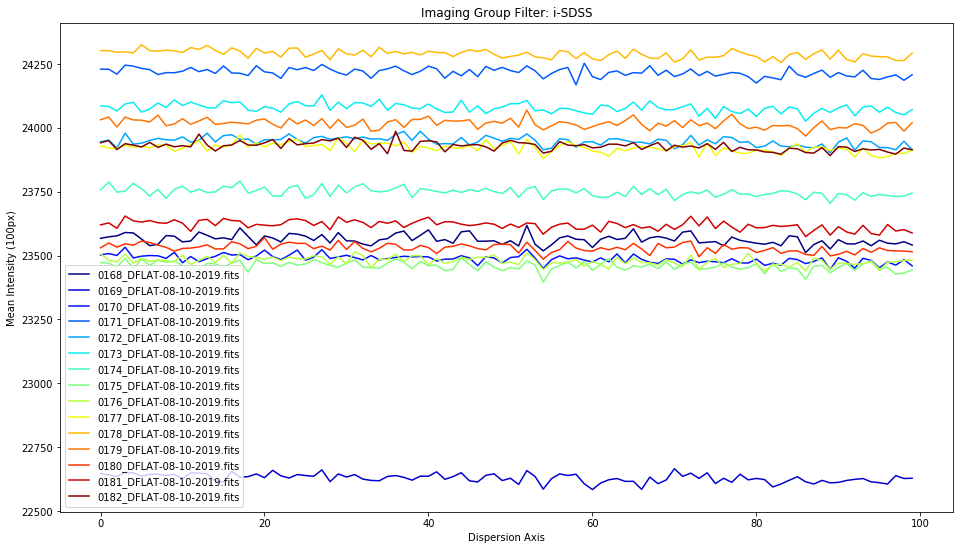

                          file   npix        mean      stddev    min    max
0   0168_DFLAT-08-10-2019.fits  10000  23562.8848  161.693954  19918  25398
1   0169_DFLAT-08-10-2019.fits  10000  22629.0115  157.636722  18946  25110
2   0170_DFLAT-08-10-2019.fits  10000  23486.9174  159.907119  19715  24038
3   0171_DFLAT-08-10-2019.fits  10000  24216.7796  161.598726  20334  24883
4   0172_DFLAT-08-10-2019.fits  10000  23947.5308  162.592716  20205  24572
5   0173_DFLAT-08-10-2019.fits  10000  24078.1687  163.570894  20230  24803
6   0174_DFLAT-08-10-2019.fits  10000  23748.9908  160.647496  20090  24338
7   0175_DFLAT-08-10-2019.fits  10000  23459.2489  159.905564  19764  24072
8   0176_DFLAT-08-10-2019.fits  10000  23478.5166  159.948063  19636  24058
9   0177_DFLAT-08-10-2019.fits  10000  23921.9643  162.754340  20215  24490
10  0178_DFLAT-08-10-2019.fits  10000  24289.1363  163.679485  20451  24916
11  0179_DFLAT-08-10-2019.fits  10000  24016.4187  162.915304  20321  24722
12  0180_DFL

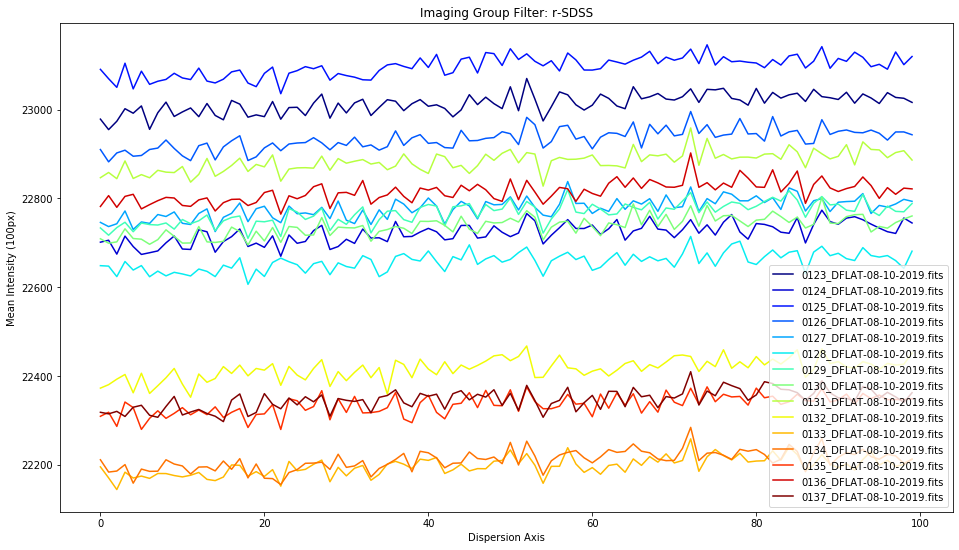

                          file   npix        mean      stddev    min    max
0   0123_DFLAT-08-10-2019.fits  10000  23014.0035  185.689266  19239  23726
1   0124_DFLAT-08-10-2019.fits  10000  22721.9512  185.214361  19098  23404
2   0125_DFLAT-08-10-2019.fits  10000  23097.7047  184.940191  19290  23797
3   0126_DFLAT-08-10-2019.fits  10000  22933.5377  183.746823  19348  23596
4   0127_DFLAT-08-10-2019.fits  10000  22778.0521  183.461872  19226  23447
5   0128_DFLAT-08-10-2019.fits  10000  22658.0131  182.486485  19046  23342
6   0129_DFLAT-08-10-2019.fits  10000  22767.4520  183.008886  19051  23482
7   0130_DFLAT-08-10-2019.fits  10000  22737.1134  184.985127  19156  23441
8   0131_DFLAT-08-10-2019.fits  10000  22883.3525  184.391679  19084  23585
9   0132_DFLAT-08-10-2019.fits  10000  22416.2081  182.891970  18672  23118
10  0133_DFLAT-08-10-2019.fits  10000  22196.7275  180.987638  18505  23050
11  0134_DFLAT-08-10-2019.fits  10000  22209.9395  178.986040  18722  22957
12  0135_DFL

In [13]:
import pandas as pd
for group, technique, master_flat in all_data:
    cmap = plt.get_cmap('jet')
    colors = [cmap(i) for i in np.linspace(0, 1, len(group))]
    if technique == 'Spectroscopy':
        print('Spectroscopy Group Filter2: {} Grating: {} Slit: {} Wavmode: {}'.format(group.filter2.unique()[0],
                                                                                       group.grating.unique()[0], 
                                                                                       group.slit.unique()[0], 
                                                                                       group.wavmode.unique()[0]))
              
        fig_1, ax_1 = plt.subplots(figsize=(16,9))
#         fig_1, ax_1 = plt.subplots()
        ax_1.set_xlabel('Dispersion Axis')
        ax_1.set_ylabel('Mean Intensity (100px)')
        
        for i, _image in enumerate(group.file.tolist()):
            ccd = CCDData.read(os.path.join(full_path_data_location, _image), unit='adu')
            x, y = ccd.data.shape
            x_0 = int(x / 2.) - 50
            x_1 = int(x / 2.) + 49
            
            y_0 = 1
            y_1 = y
            
            region = "[:, {}:{}]".format(x_0, x_1)
            ccd = goodman_pipeline.core.image_trim(ccd=ccd, trim_section=region, trim_type='subsection')
            ccd.data = np.mean(ccd.data, axis=0)
            ax_1.plot(ccd.data, color=colors[i], label=_image)
        plt.legend(loc='best')
#         plt.show()
    else:
        _title = 'Imaging Group Filter: {}'.format(group['filter'].unique()[0])
        print(_title)
        _data = {'file': [], 'npix': [], 'mean': [], 'stddev': [], 'min': [], 'max': []}
        
        fig, ax = plt.subplots(figsize=(16,9))
#         fig, ax = plt.subplots()
        ax.set_xlabel('Dispersion Axis')
        ax.set_ylabel('Mean Intensity (100px)')
        ax.set_title(_title)
        
        for i, _image in enumerate(group.file.tolist()):
            ccd = CCDData.read(os.path.join(full_path_data_location, _image), unit='adu')
            x, y = ccd.data.shape
            x_0 = int(x / 2.) - 50
            x_1 = int(x / 2.) + 49
            
            y_0 = int(y / 2.) - 50
            y_1 = int(y / 2.) + 49
            
            region = "[{}:{}, {}:{}]".format(x_0, x_1, y_0, y_1)
            print(region)
            print(ccd.data.shape)
            ccd = goodman_pipeline.core.image_trim(ccd=ccd, trim_section=region, trim_type='subsection')
            print(ccd.data.shape)
#             fig, ax = plt.subplots(figsize=(16, 9))
#             ax.imshow(ccd.data, cmap='viridis')
            # IMAGE      NPIX      MEAN    STDDEV       MIN       MAX
            _npix = np.prod(ccd.data.shape)
            _mean = np.mean(ccd.data)
            _stdev = np.std(ccd.data)
            _min = np.min(ccd.data)
            _max = np.max(ccd.data)
            _data['file'].append(_image)
            _data['npix'].append(_npix)
            _data['mean'].append(_mean)
            _data['stddev'].append(_stdev)
            _data['min'].append(_min)
            _data['max'].append(_max)
            
            
            mean_data = np.mean(ccd.data, axis=0)
            ax.plot(mean_data, color=colors[i], label=_image)
        plt.legend(loc='best')
        plt.show()
            
        df = pd.DataFrame(data=_data)
        print(df.to_string())
        print(" ")
            
            

#             print("extraction zone [{}:{}, {}:{}]".format(x_0, x_1, y_0, y_1))
             